In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

from os import listdir, path, makedirs
from os.path import isfile, join

import shutil

In [3]:
path = "marcos/"
lista_arq_img = [f for f in listdir(path) if isfile(join(path, f))]
faces_path = "cropped_faces/"

#if not path.exists(faces_path):
 #   makedirs(faces_path)

face_imagem = 0
#https://github.com/Itseez/opencv/blob/master/data/haarcascades/haarcascade_frontalface_default.xml
clf = cv2.CascadeClassifier("classificadores/haarcascade_frontalface_default.xml")

for arq in lista_arq_img:
    imagem = cv2.imread(path+arq)
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
    
   # imagem_anotada = imagem.copy()
    
    faces = clf.detectMultiScale(imagem_gray, 1.3, 5)
    for (x,y,w,h) in faces:
        face_imagem += 1
        imagem_roi = imagem[y:y+h, x:x+w]
        imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
        cv2.imwrite(faces_path +"/face_" + str(face_imagem) + ".png", imagem_roi)

In [4]:
def padronizar_imagem(imagem_caminho):
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
    imagem = cv2.resize(imagem, (200, 200), interpolation=cv2.INTER_LANCZOS4)
    return imagem

In [5]:
lista_faces = [f for f in listdir(faces_path) if isfile(join(faces_path, f))]
dados_treinamento, label = [], []

for i, arq in enumerate (lista_faces):
    imagem_path = faces_path + arq
    imagem = padronizar_imagem(imagem_path)
    dados_treinamento.append(imagem)
    label.append(0)
    
    

In [6]:
#modelo =  cv2.face.EigenFaceRecognizer_create()
#modelo = cv2.face.FisherFaceRecognizer_create()

modelo = cv2.face.LBPHFaceRecognizer_create()


modelo.train(dados_treinamento, np.array(label))

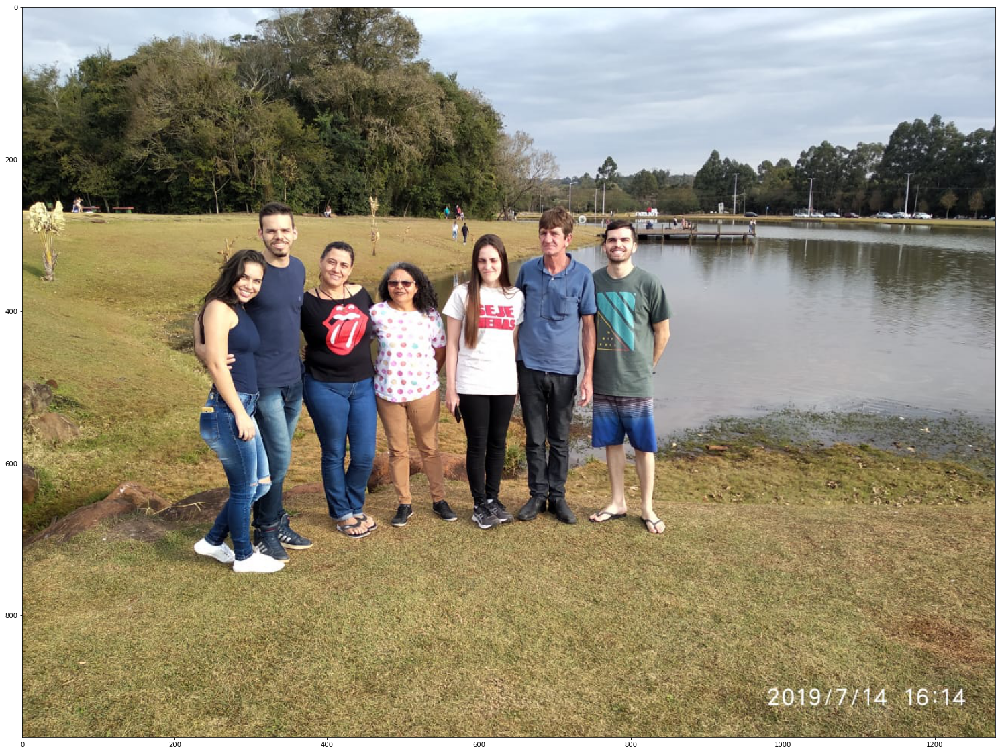

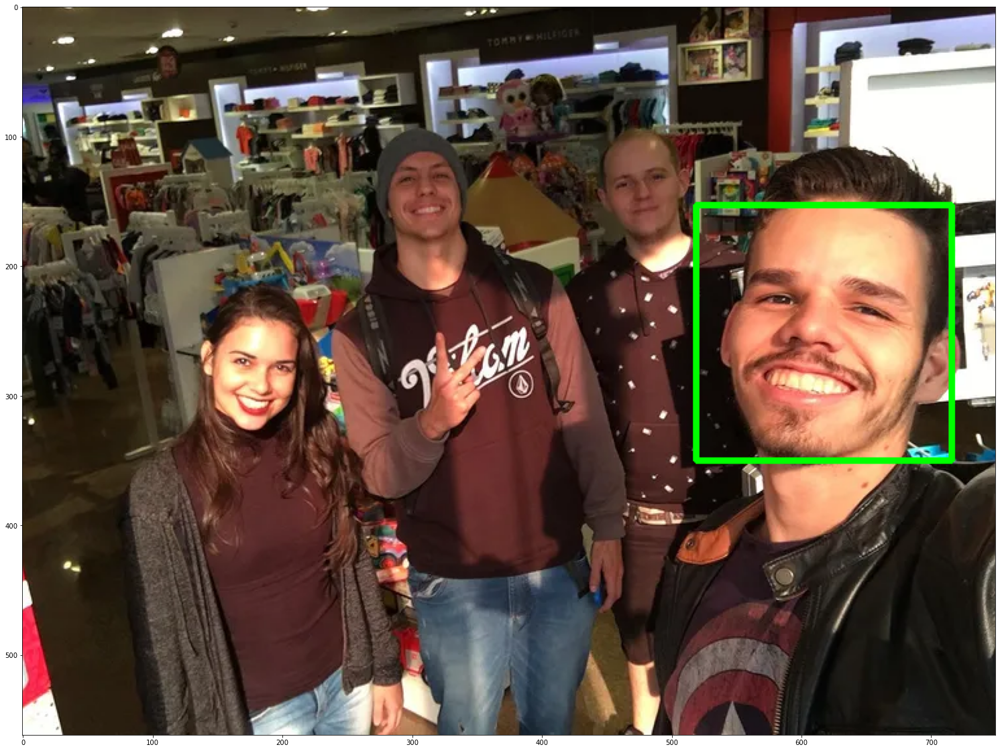

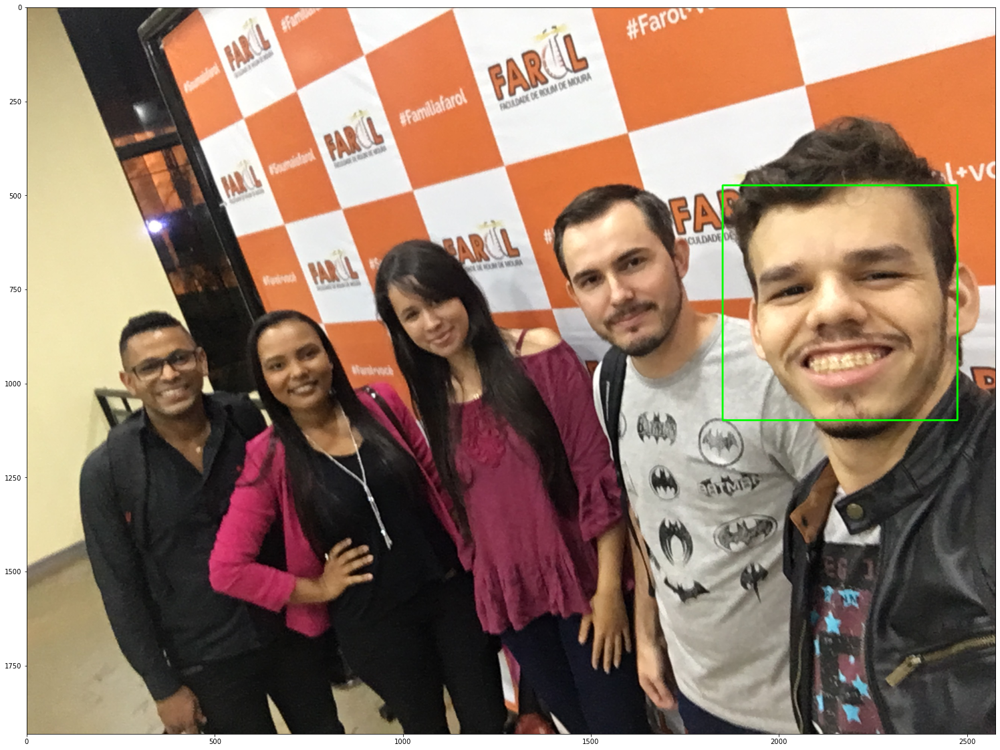

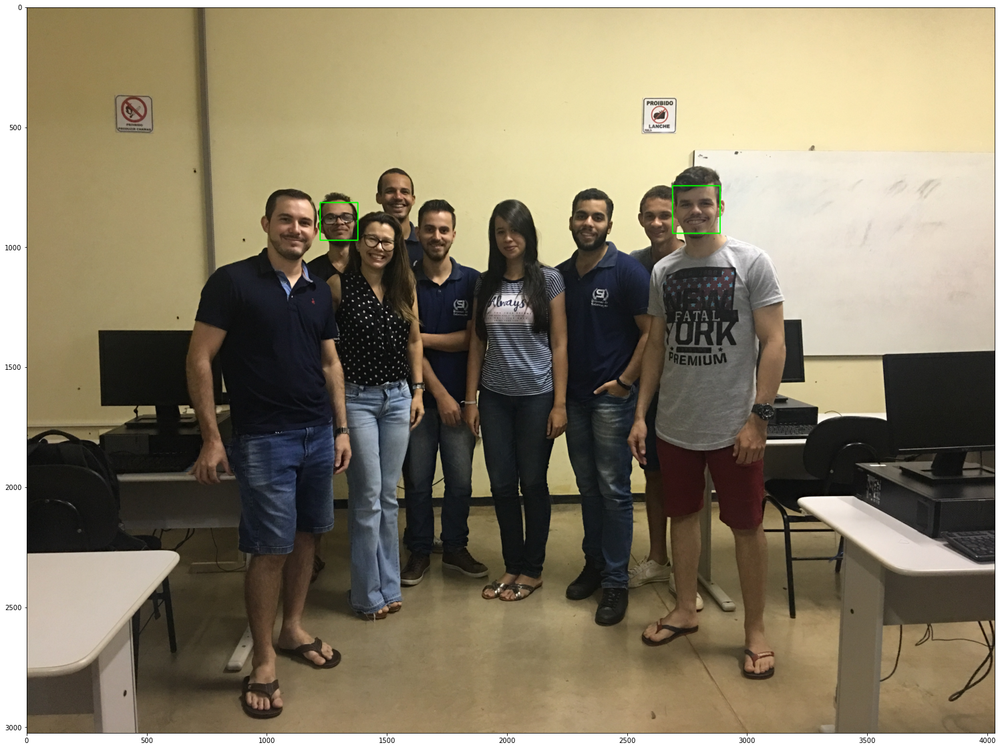

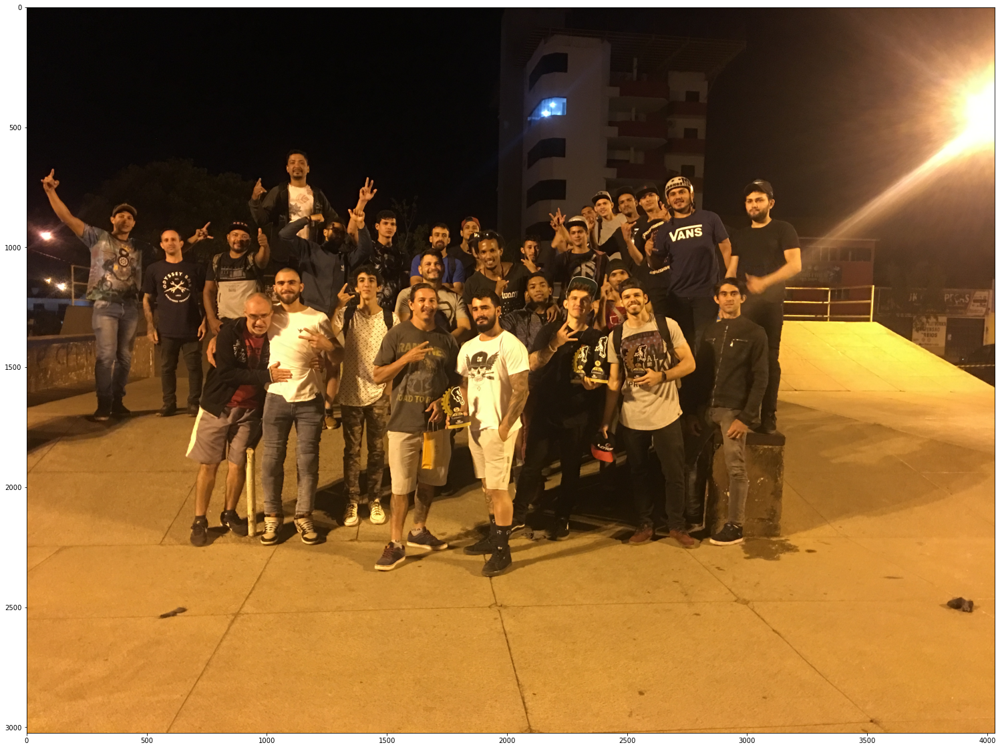

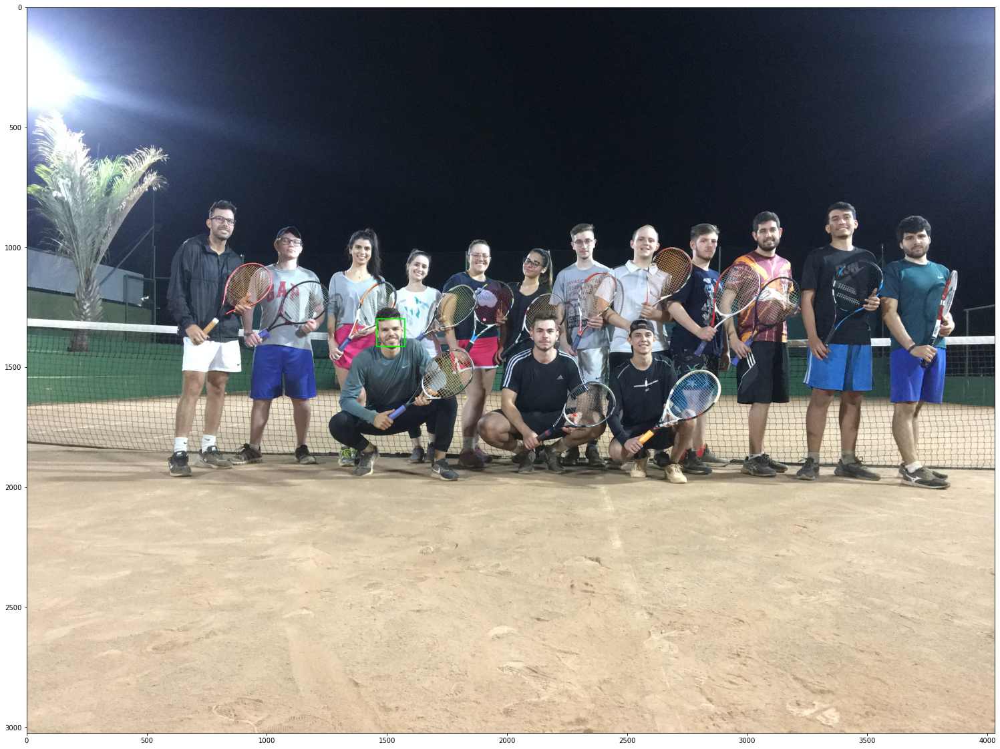

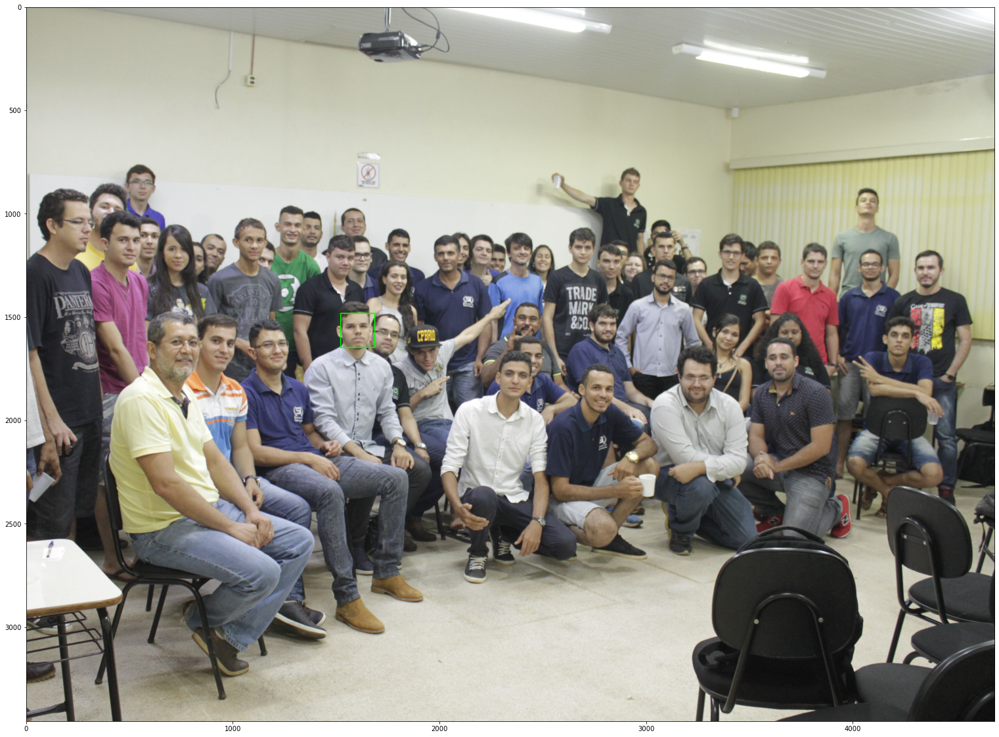

In [7]:
path_encontrar = "encontre/"
lista_enc_img = [f for f in listdir(path_encontrar) if isfile(join(path_encontrar, f))]

#https://github.com/Itseez/opencv/blob/master/data/haarcascades/haarcascade_frontalface_default.xml
classificador = cv2.CascadeClassifier("classificadores/haarcascade_frontalface_default.xml")

for arq in lista_enc_img:
    imagem = cv2.imread(path_encontrar+arq)
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
    
    imagem_anotada = imagem.copy()
    
    faces = clf.detectMultiScale(imagem_gray, 1.3, 5)
    for (x,y,w,h) in faces:
        face_imagem += 1
        imagem_roi = imagem[y:y+h, x:x+w]
        imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2GRAY)
        
        predicao = modelo.predict(imagem_roi)
        #print(predicao)
        if (predicao[1] < 55):
            cv2.rectangle(imagem_anotada, (x,y), (x+w, y+h), (0, 255, 0), 3)
            #cv2.putText(imagem_anotada, str(round(predicao[1],1)), (x,y), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 2,2)
    plt.figure(figsize=(30,20))
    plt.imshow(imagem_anotada)